# Taller 1 - Ciencia de Datos Aplicada
### Integrantes: Juan Lucas Ibarra Sierra - 201813900
### Objetivo: 
Evaluar las capacidades del estudiante para realizar análisis de datos utilizando técnicas estadísticas y de visualización que permitan entender un conjunto de datos, descubrir insights y plantear hipótesis de negocio.

# 1. Descargar e importar librerias

In [467]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip (22.0 MB)
  Created wheel for pandas-profiling: filename=pandas_profiling-3.3.0-py2.py3-none-any.whl size=268024 sha256=2c36bddd594aa1f0cf323b7ffd70ab97b0ed59b08bf5633f7a6f00f637281546
  Stored in directory: C:\Users\Juan Lucas\AppData\Local\Temp\pip-ephem-wheel-cache-grlqvssz\wheels\64\b6\85\dfc808b23666a5910371784e349d28818006ff63ed9cfeca59
Successfully built pandas-profiling


In [468]:
!pip install plotly
!pip install cufflinks

In [469]:
import pandas as pd
import numpy as np
import cufflinks as cf
import seaborn as sns
import plotly.express as px
%matplotlib inline
from pandas_profiling import ProfileReport

from io import StringIO

# Make Plotly work in your Jupyter Notebook
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
# Use Plotly locally
cf.go_offline()

# 2. Limpieza y carga de datos

In [470]:
spotify_dataset_string = ''
dataset_file = open('Data_Taller_1.csv', 'r', encoding='utf-8-sig')
Lines = dataset_file.readlines()
  
for line in Lines:
    # Si la linea empieza por ", borrar y reemplazar el primer caracter y los 3 ultimos
    if line.startswith('\"'):
        line = line[1:len(line)-3]
    # Este artista puede generar problemas al leer al CSV debido a su nombre, por lo cual se trata de manera especial
    if 'Tyler' in line:
        line = line.replace(',', '', 1)
    # Reemplaza dobles comas simples por comas sencillas
    line = line.replace('\"\"','\"')
    # Elimina el punto y coma de los generos
    line = line.replace(';','')
    # Le agrega la linea con cambio de linea al string inicial
    spotify_dataset_string += line + "\n"
# Carga el string como un objeto IO para leer el CSV despues de las transformaciones
spotify_dataset = StringIO(spotify_dataset_string)

spotify_df = pd.read_csv(spotify_dataset, quotechar='\"', sep=',')

In [471]:
spotify_df

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
0,Britney Spears,Oops!...I Did It Again,211160.0,False,2000,77.0,0.751,0.834,1,-5.444,0,0.0437,0.3000,0.000018,0.3550,0.894,95.053,pop
1,blink-182,All The Small Things,167066.0,False,1999,79.0,0.434,0.897,0,-4.918,1,0.0488,0.0103,0.000000,0.6120,0.684,148.726,"rock, pop"
2,Faith Hill,Breathe,250546.0,False,1999,66.0,0.529,0.496,7,-9.007,1,0.0290,0.1730,0.000000,0.2510,0.278,136.859,"pop, country"
3,Bon Jovi,It's My Life,224493.0,False,2000,78.0,0.551,0.913,0,-4.063,0,0.0466,0.0263,0.000014,0.3470,0.544,119.992,"rock, metal"
4,*NSYNC,Bye Bye Bye,200560.0,False,2000,NaN,0.614,0.928,8,-4.806,0,0.0516,0.0408,0.001040,0.0845,0.879,172.656,pop
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,Jonas Brothers,Sucker,181026.0,False,2019,79.0,0.842,0.734,1,-5.065,0,0.0588,0.0427,0.000000,0.1060,0.952,137.958,pop
1996,Taylor Swift,Cruel Summer,178426.0,False,2019,78.0,0.552,0.702,9,-5.707,1,0.1570,0.1170,0.000021,0.1050,0.564,169.994,pop
1997,Blanco Brown,The Git Up,200593.0,False,2019,69.0,0.847,0.678,9,-8.635,1,0.1090,0.0669,0.000000,0.2740,0.811,NaN,"hip hop, country"
1998,Sam Smith,Dancing With A Stranger (with Normani),171029.0,False,2019,75.0,0.741,0.520,8,-7.513,1,0.0656,0.4500,0.000002,0.2220,0.347,102.998,pop


In [472]:
spotify_df.shape

(2000, 18)

# 3. Analisis exploratorio de los datos

## Punto 1. Describa el conjunto de datos, tipos de variables y destaque cualquier problema de calidad de datos y procesos de limpieza que deba implementar

### 3.1.1 Analisis de las variables

#### artist
Variable categorica nominal, tiene 835 valores distintos (41.8%), 0 valores vacios, y los 3 mas repetidos son Rihanna, Drake y Eminem.
#### song
Variable categorica nominal, tiene 1879 valores distintos (94%), 0 valores vacios.
#### duration_ms
Variable cuantitativa continua, tiene 2 valores vacios, la media es de 228744.4259 milisegundos, el minimo es 113000 milisegundos, el maximo es 484146 milisegundos, desviacion estandar de 39155.96616 milisegundos y no tiene negativos ni ceros
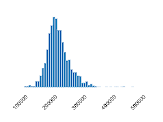
#### explicit
Variable categorica nominal, tiene 2 valores distintos (True, False), 1 valor vacio.
#### year 
Variable cuantitativa discreta, tiene 23 valores distintos, 0 valores vacios, la media es 2009.494, el minimo es 1998, el maximo es 2020, desviacion estandar de 5.859960202, sin negativos y ceros.
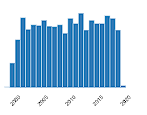
#### popularity
Variable cuantitativa continua, tiene 76 valores distintos, 3 valores vacios, la media es de 59.85928893, el minimo es 0 y el maximo es 89, desviacion estandar de 21.34863599, sin negativos y 126 ceros
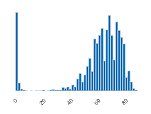
#### danceability        
Variable cuantitativa continua, tiene 565 valores distintos, 3 valores vacios, la media es 0.6673630446, el minimo es 0.129 y el maximo es 0.975. Desviacion estandar de 0.1404817359, sin negativos y sin ceros
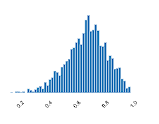
#### energy
Variable cuantitativa continua, tiene 580 valores distintos, 0 valores vacios, la media es 0.720366, el minimo es 0.0549 y el maximo es 0.999. Desviacion estandar de 0.1527452844, sin negativos y sin ceros
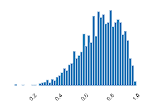
#### key
Variable cuantitativa discreta, tiene 12 valores distintos, 0 valores vacios, la media es 5.378, el minimo es 0 y el maximo es 11. Desviacion estandar de 3.615058827, sin negativos y 198 ceros
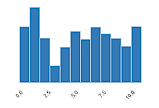
#### loudness 
Variable cuantitativa continua, tiene 1670 valores distintos, 1 valor vacios, la media es -5.511913957, el minimo es -20.514 y el maximo es -0.276. Desviacion estandar de 1.933825624, todos los valores negativos y sin ceros
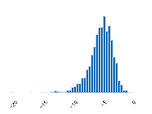
#### mode 
Variable categorica ordinal, tiene 2 valores distintos (0 es minor y 1 es major), 0 valores vacios, la moda es 1 (major) con 1107 valores contra 893
#### speechiness
Variable cuantitativa continua, tiene 837 valores distintos, 1 valor vacio, la media es 0.1036046023, el minimo es 	0.0232 y el maximo es 0.576. Desviacion estandar de 0.09616865856, sin negativos y sin ceros
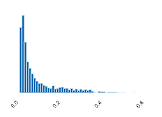
#### acousticness      
Variable cuantitativa continua, tiene 1208 valores distintos, 3 valores vacios, la media es 0.1291065378, el minimo es 1.92 × 10^-5, el maximo es 0.976. Desviacion estandar de 0.1734314305, sin negativos y sin ceros
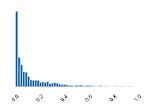
#### instrumentalness       
Variable cuantitativa continua, tiene 772 valores distintos, 1 valor vacio, la media es 0.01523360741, el minimo es 0, el maximo es 0.985. Desviacion estandar de 0.08779202234, sin negativos y 1086 ceros
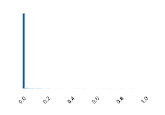
#### liveness    
Variable cuantitativa continua, tiene 783 valores distintos, 0 valores vacios, la media es 0.1812158, el minimo es 0.0215, el maximo es 0.853. Desviacion estandar de 0.1406692067, sin negativos y sin ceros
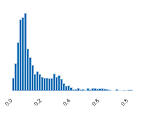
#### valence
Variable cuantitativa continua, tiene 760 valores distintos, 1 valor vacio, la media es 0.551722011, el minimo es 0.0381, el maximo es 0.973. Desviacion estandar de 0.2209147114, sin negativos y sin ceros
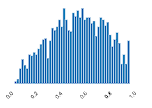
#### tempo    
Variable cuantitativa continua, tiene 1829 valores distintos, 2 valores vacios, la media es 120.1035771, el minimo es 60.019, el maximo es 210.851. Desviacion estandar de 26.94255486, sin negativos y sin ceros
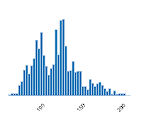
#### genre
Variable categorica nominal, tiene 65 valores distintos, 0 valores vacios, y los 3 mas repetidos son "pop", "hip hop, pop" y "hip hop, pop, R&B"

In [473]:
spotify_df.dtypes

artist               object
song                 object
duration_ms         float64
explicit             object
year                  int64
popularity          float64
danceability        float64
energy              float64
key                   int64
loudness            float64
mode                  int64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
genre                object
dtype: object

In [474]:
ProfileReport(spotify_df)

#### 3.1.2 Limpieza de los datos

En la parte 2 del taller se realizo una limpieza previa del archivo ya que generaba algunos problemas al momento de cargar el CSV. Los errores eran los siguientes:

1. Algunas filas comenzaban y terminaban con comilla doble, por lo cual Python lo tomaba como si fuera un solo datos, se eliminaron esas comillas
2. La columna genre estaba delimitada por dobles comillas, se cambio a solo un par de comillas para facilitar la lectura
3. El artista Tyler, The Creator generaba problemas al tener coma en su nombre y hacia que se generara una columna adicional, se le hizo un tratamiento especial para evitar problemas de lectura
4. Eliminar los punto y coma de las lineas del CSV

Ademas de esta limpieza, en el dataset tenemos 59 filas duplicadas, por lo cual se procede a eliminarlas para evitar errores en el analisis

In [502]:
duplicates = spotify_df[spotify_df.duplicated()].sort_values(by='artist')

In [476]:
duplicates.shape

(59, 18)

In [477]:
spotify_df = spotify_df.drop_duplicates()

In [478]:
spotify_df.shape

(1941, 18)

In [479]:
spotify_df['genre'].unique()

array(['pop', 'rock, pop', 'pop, country', 'rock, metal',
       'hip hop, pop, R&B', 'hip hop', 'pop, rock', 'pop, R&B',
       'Dance/Electronic', 'pop, Dance/Electronic',
       'rock, Folk/Acoustic, easy listening', 'metal', 'hip hop, pop',
       'R&B', 'pop, latin', 'Folk/Acoustic, rock',
       'pop, easy listening, Dance/Electronic', 'rock',
       'rock, blues, latin', 'pop, rock, metal', 'rock, pop, metal',
       'hip hop, R&B', 'pop, Folk/Acoustic', 'set()',
       'hip hop, pop, latin', 'hip hop, Dance/Electronic',
       'hip hop, pop, rock', 'World/Traditional, Folk/Acoustic',
       'Folk/Acoustic, pop', 'rock, easy listening',
       'World/Traditional, hip hop', 'hip hop, pop, R&B, latin',
       'rock, blues', 'rock, R&B, Folk/Acoustic, pop', 'latin',
       'pop, R&B, Dance/Electronic', 'World/Traditional, rock',
       'pop, rock, Dance/Electronic', 'pop, easy listening, jazz',
       'rock, Dance/Electronic', 'World/Traditional, pop, Folk/Acoustic',
       'countr

## Punto 1. ¿Cuál es el top 10 de artistas más activos de los últimos 10 años?
Calvin Harris,
Drake,
Ariana Grande,
David Guetta,
Taylor Swift,
Katy Perry,
Avicii,
Ed Sheeran,
Maroon 5,
One Direction

In [480]:
# Filtrar por los ultimos 10 anios
last_10_years_df = spotify_df.query('year <= 2022 and year >= 2012')

In [481]:
top_10 = last_10_years_df.groupby(by='artist').count()['song'].nlargest(10)
top_10

artist
Calvin Harris    18
Drake            16
Ariana Grande    13
David Guetta     13
Taylor Swift     13
Katy Perry       11
Avicii            9
Ed Sheeran        9
Maroon 5          9
One Direction     9
Name: song, dtype: int64

In [482]:
fig = px.bar(top_10)
fig.show()

## Punto 2. ¿Cómo se diferencian las canciones de los géneros de Latin y Folk/Acoustic en relación con su duración? Halle la diferencia del tiempo promedio de ambos géneros.
La diferencia entre el promedio de ambas es 7311 milisegundos, es decir aproximadamente 7.3 segundos

In [483]:
latin_songs_avg_df = spotify_df[spotify_df['genre'].str.contains("latin", na=False)]
latin_songs_avg = latin_songs_avg_df['duration_ms'].mean()
latin_songs_avg

227494.68253968254

In [484]:
folk_songs_avg_df = spotify_df[spotify_df['genre'].str.contains("Folk/Acoustic",na=False)]
folk_songs_avg = folk_songs_avg_df['duration_ms'].mean()
folk_songs_avg

220183.65

In [485]:
latin_songs_avg-folk_songs_avg

7311.03253968255

## Punto 3. Halle el top 5 de los géneros del 2019 según la cantidad de canciones. ¿Cómo ha variado la cantidad de canciones del Top de géneros en los años 2000, 2005, 2010, 2015, 2019?

In [486]:
year_2019_df = spotify_df.query('year == 2019')
year_2019_df.head()

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
194,K-Ci & JoJo,Crazy,262773.0,False,2019,30.0,0.680,0.644,0,-4.507,1,0.0258,0.08400,0.000000,0.5490,0.484,116.097,"pop, R&B"
214,Angie Martinez,If I Could Go! (feat. Lil' Mo & Sacario),244466.0,False,2019,40.0,0.583,0.643,9,-7.486,0,0.3550,0.17100,0.000000,0.0395,0.700,195.685,pop
217,Aaliyah,Rock The Boat,275026.0,False,2019,0.0,0.641,0.720,5,-5.209,1,0.0336,0.06880,0.002860,0.1930,0.418,92.988,"hip hop, pop, R&B"
244,Liberty X,Just A Little,237359.0,False,2019,43.0,0.786,0.614,5,-6.554,0,0.0574,0.00616,0.000000,0.0490,0.742,103.887,pop
333,Lil' Kim,Magic Stick,359973.0,True,2019,47.0,0.849,0.498,2,-7.872,1,0.2720,0.11600,0.000045,0.2680,0.502,92.980,"hip hop, pop, R&B"


In [487]:
year_2019_df.groupby(by='genre').count()['song'].nlargest(5)

genre
pop                      25
hip hop                  13
pop, Dance/Electronic    13
hip hop, pop             10
hip hop, pop, R&B         7
Name: song, dtype: int64

In [507]:
years = [2000, 2005, 2010, 2015, 2019]
genres = ['pop','hip hop','pop, Dance/Electronic','hip hop, pop','hip hop, pop, R&B']

#Saca las estadisticas por genero de un anio
def yearStatisticsForGenre(year):
    query_year = 'year == {year}'.format(year = year)
    query_year_df = spotify_df.query(query_year)
    return query_year_df.groupby(by='genre').count()['song'].get(genres)

lista = ['year','category','quant']
df_genres_years = pd.DataFrame(columns=lista)

# Construye el dataframe para realizar el grafico
for year in years:
    year_series = yearStatisticsForGenre(year)
    for i, v in year_series.items():
        list_row = [year, i, v]
        df_genres_years.loc[len(df_genres_years)] = list_row
        
fig = px.histogram(df_genres_years, x="year", y="quant",
             color='category', barmode='group', nbins=10,
            height=400, width=900)

fig.update_layout(
    title="Number of songs from top 5 genres per year",
    xaxis_title="Year",
    yaxis_title="# songs",
    legend_title="Genre",
)

fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = years,
        ticktext = years
        )
    )

fig.show()

## Punto 4. ¿Cómo ha sido la progresión de nuevos artistas? Asuma que un artista nuevo es aquel del cual no se tiene registros pasados y solo es nuevo durante el primer año de aparición.

In [506]:
new_artists = []
new_artist_year = []
years = spotify_df['year'].unique()
#Obtiene los artistas nuevos por anio
for year in years:
    # Crea el dataframe de los artistas filtrados
    new_artist_filter = spotify_df[spotify_df['year']==year]
    number_artists=0
    for index, row in new_artist_filter.iterrows():
        # Si el artista no esta, lo agrega a la lista y suma la cantidad de artistas nuevos por anio
        if row['artist'] not in new_artists:
            new_artists.append(row['artist'])
            number_artists+=1
    new_artist_year.append(number_artists)
    
data = {
  "year": years,
  "new_artists": new_artist_year
}
new_artist_df = pd.DataFrame(data)

fig = px.bar(new_artist_df, x='year', y='new_artists')
fig.update_layout(
    title="Number of new artists per year",
    xaxis_title="Year",
    yaxis_title="# of new artists",
)

fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = years,
        ticktext = years
        )
    )
fig.show()

## Punto 5. Grafique la progresión de la popularidad promedio por género y por año. Concluya sobre la gráfica, ej: ¿existen tendencias?
Debido a la cantidad de generos que existen se debe hacer un analisis mas exhaustivo y expecifico. Se tomo como regla de negocio que en la lista de generos el primero es el que mas pertenece a la cancion y se hicieron 3 analisis.

1. Todos los generos
2. Genero favorito
3. Analisis por un solo genero favorito

Analizando estos 3 graficos vemos como con la medida del tiempo fueron apareciendo y desaparaciendo generos como el country que va desde 2005 a 2013, vemos generos muy populares como el pop que estuvo desde el primer anio hasta el actual (2020). Vemos que generos fueron muy populares pero han perdido audiencia como el rock, que no entra al top desde 2018

In [490]:
# Grafica de todos los generos por anios, la grafica se ve muy saturada de informacion, por lo cual se hacen distintos 
# analisis mas abajo
years = spotify_df_copy['year'].unique()
fig = px.histogram(spotify_df.sort_values(by='year'), x="year", y="popularity",
             color='genre', barmode='group',
            height=400, histfunc='avg')

fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = years,
        ticktext = years
        )
    )

fig.update_layout(
    title="Average of popularity by genre by year",
    xaxis_title="Year",
    yaxis_title="Average of popularity",
    legend_title="Genre",
)

fig.show()

In [491]:
spotify_df_copy = spotify_df.copy().dropna(subset=['genre'])

In [492]:
# Se saca el primer genero separado por comas de la cancion
spotify_df_copy['favoriteGenre'] = spotify_df_copy['genre'].transform(lambda x: x.split(',')[0])

In [493]:
# Analisis para el genero principal de la cancion
fig = px.histogram(spotify_df_copy.sort_values(by='year'), x="year", y="popularity",
             color='favoriteGenre', barmode='group',
            height=400, histfunc='avg',nbins=23)

fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = years,
        ticktext = years
        )
    )

fig.update_layout(
    title="Average of popularity by favorite genre by year",
    xaxis_title="Year",
    yaxis_title="Average of popularity",
    legend_title="Genre",
)

fig.show()

In [494]:
# Analisis para un solo genero
def graphicByPopularity(genre):
    filter_df = spotify_df_copy[spotify_df_copy['favoriteGenre'].str.contains(genre)].sort_values(by='year')
    years = filter_df['year'].unique()
    fig = px.histogram(filter_df, x='year', y="popularity",
             color='favoriteGenre', barmode='group',
            height=400, histfunc='avg', nbins=23)
    
    fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = years,
        ticktext = years
        )
    )
    
    fig.update_layout(
    title="Average of popularity in genre {genre} by year".format(genre=genre),
    xaxis_title="Year",
    yaxis_title="Average of popularity",
    legend_title="Genre",
    )
    
    fig.show()
    
graphicByPopularity('country')
graphicByPopularity('pop')
graphicByPopularity('rock')

## Punto 6. Compare los géneros Pop y Rock según sus características de: energy, valence y tempo.Concluya sobre su análisis.
Podemos observar con los valores que las canciones de rock tienen mas energia y mas tempo que el pop en promedio, mientras que el pop tiene mas valence que el rock. Los datos tienen desviaciones estandar que se pueden considerar bajas, por lo cual el promedio puede ser un buen medidor. Sin embargo existen canciones de pop con mas tempo que el maximo de rock, lo cual es curioso guiandonos por el promedio.

In [495]:
rock_songs_df = spotify_df[spotify_df['genre'].str.contains("rock", na=False)]
pop_songs_df = spotify_df[spotify_df['genre'].str.contains("pop", na=False)]

In [496]:
rock_songs_df.agg(['min','max','mean','std'])[['energy','valence','tempo']]

,energy,valence,tempo
min,0.316000,0.068100,68.976000
max,0.988000,0.965000,199.935000
mean,0.791027,0.527743,126.155839
std,0.140706,0.218133,28.000921


In [497]:
pop_songs_df.agg(['min','max','mean','std'])[['energy','valence','tempo']]

,energy,valence,tempo
min,0.054900,0.038100,60.019000
max,0.999000,0.973000,210.851000
mean,0.715886,0.554806,119.732266
std,0.151564,0.221479,26.448198


## Punto 7. ¿Cual fue el top 3 de artistas con mas canciones del genero pop en 2014?
Taylor Swift con 6 canciones, Ariana Grande y Calbin Harris con 4 canciones.

In [498]:
pop_songs_df = spotify_df[(spotify_df['genre'].str.contains("pop", na=False)) & (spotify_df['year']==2014)]
pop_songs_df.groupby(by='artist').count()['song'].nlargest(3)

artist
Taylor Swift     6
Ariana Grande    4
Calvin Harris    4
Name: song, dtype: int64